# Comparison of side-hole effect

In [1]:
using DataFrames, Plots
using PyCall

In [6]:
pyplot()

Plots.PyPlotBackend()

In [44]:
include("../../src/calcimp.jl")

Main.Calcimp

## Simple 1m tube

In [3]:
run(`cat simple.xmen`)

# simple tube
[
    10,10,1000,
    10,0,0,
]



Process(`cat simple.xmen`, ProcessExited(0))

In [4]:
sm = Calcimp.calcimp("simple.xmen");

,frq,imp,mag
1,0.0,0.0+0.0im,-Inf
2,2.5,3.20225+22.4761im,27.1217
3,5.0,4.79165+42.9347im,32.7099
4,7.5,6.07926+63.2161im,36.0565
5,10.0,7.24141+83.5969im,38.4763
6,12.5,8.35513+104.245im,40.3889
7,15.0,9.46691+125.3im,41.9837
8,17.5,10.6112+146.895im,43.3628
9,20.0,11.8177+169.169im,44.5876
10,22.5,13.1152+192.269im,45.6984


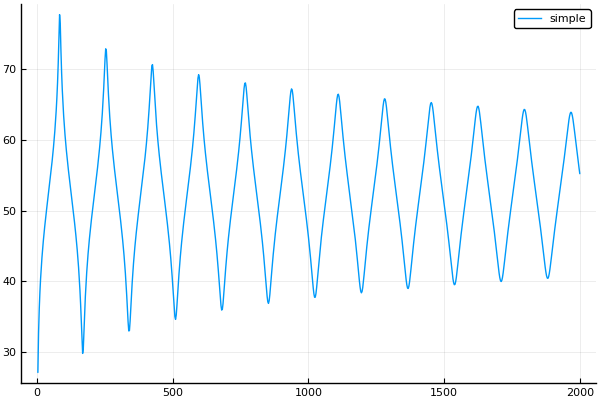

In [15]:
plot(sm[:frq],sm[:mag],label="simple")

If there is a side hole, impedance will be changed a lot.

In [8]:
run(`cat side-hole.xmen`)

# to demonstrate peak search
[
    10,10,250,
    |,SH,1,
    10,10,750,
    OPEN_END
]

{,SH
6,6,3,
OPEN_END
}


Process(`cat side-hole.xmen`, ProcessExited(0))

In [9]:
sd = Calcimp.calcimp("side-hole.xmen");

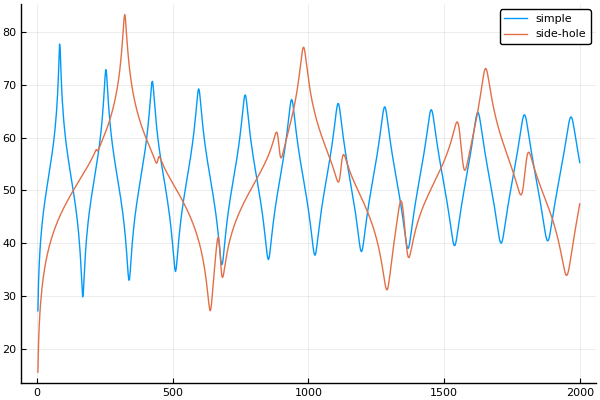

In [16]:
plot!(sd[:frq],sd[:mag],label="side-hole")

Side hole effect is small when it is closed.

In [12]:
run(`cat side-hole-close.xmen`)

# to demonstrate peak search
[
    10,10,250,
    |,SH,1,
    10,10,750,
    OPEN_END
]

{,SH
6,6,3,
CLOSED_END
}


Process(`cat side-hole-close.xmen`, ProcessExited(0))

In [13]:
cl = Calcimp.calcimp("side-hole-close.xmen");

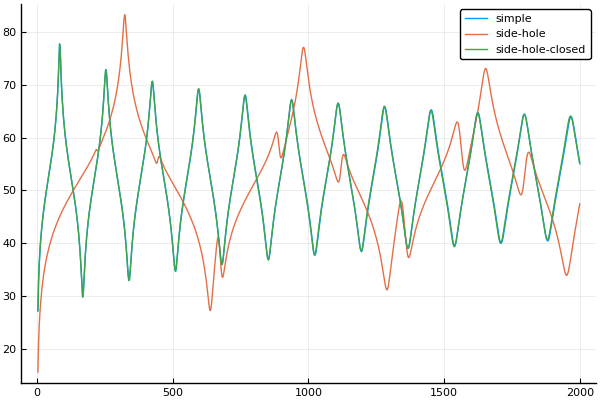

In [17]:
plot!(cl[:frq],cl[:mag],label="side-hole-closed")

Let's find 2nd peak of simple.xmen.

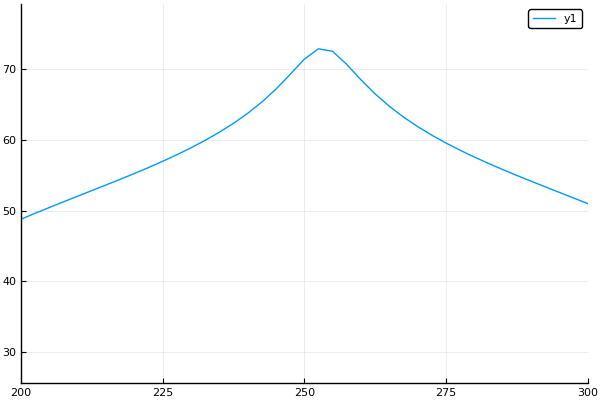

In [24]:
plot(sm[:frq],sm[:mag], xlims = (200,300))

In [65]:
i1 = findfirst(a->a==200.0, sm[:frq])

81

In [66]:
i2 = findfirst(a->a==300.0, sm[:frq])

121

In [67]:
m,midx = findmax(sm[:mag][i1:i2])

(72.89769212666963, 22)

In [68]:
sm[:mag][i1+midx-1]

72.89769212666963

In [69]:
# frequency at the peak
f = sm[:frq][i1+midx-1]

252.5

In [70]:
sm_prs = Calcimp.calcprs("simple.xmen",f);

In [71]:
sm_prs[:pmag]=Calcimp.dBSPL.(sm_prs[:p]);

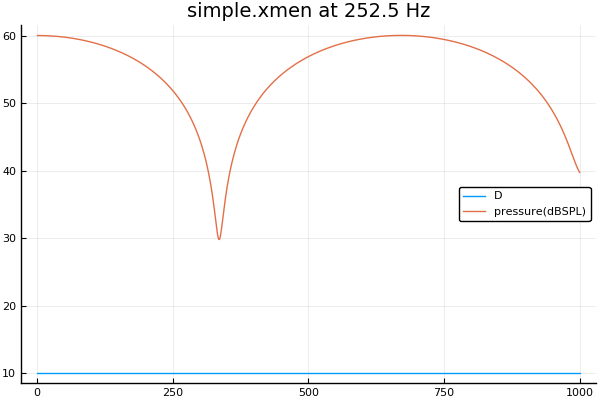

In [72]:
plot(sm_prs[:x],sm_prs[:D],label="D", title = "simple.xmen at $f Hz")
plot!(sm_prs[:x],sm_prs[:pmag],label="pressure(dBSPL)")

Calculate pressure for the 1st peak of side-hole.xmen.

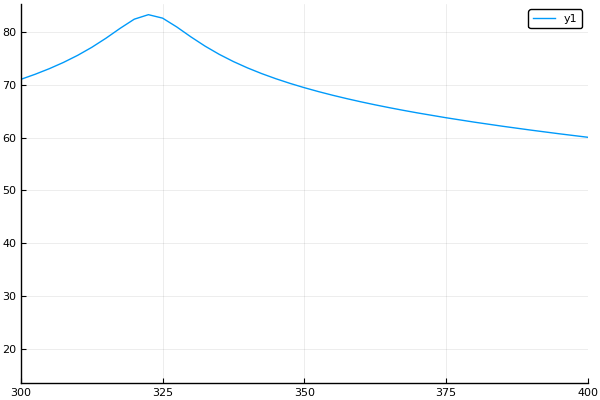

In [75]:
plot(sd[:frq],sd[:mag],xlims=(300,400))

In [77]:
i1 = findfirst(a->a==300.0,sd[:frq])

121

In [78]:
i2 = findfirst(a->a==400.0,sd[:frq])

161

In [79]:
m,midx = findmax(sd[:mag][i1:i2])

(83.30146108391179, 10)

In [80]:
# frequency at the peak
f = sd[:frq][i1+midx-1]

322.5

In [81]:
sd_prs = Calcimp.calcprs("side-hole.xmen",f);

In [82]:
sd_prs[:pmag]=Calcimp.dBSPL.(sd_prs[:p]);

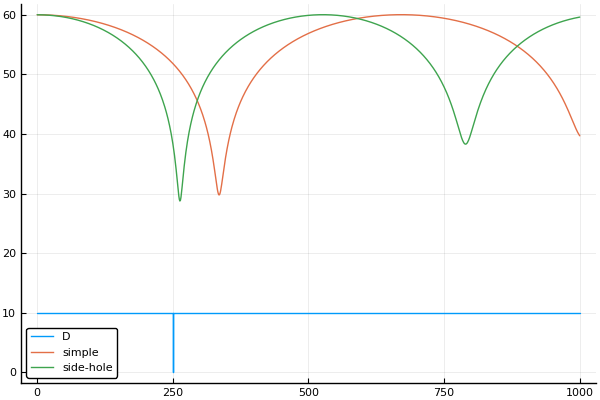

In [83]:
plot(sd_prs[:x],sd_prs[:D],label="D")
plot!(sm_prs[:x],sm_prs[:pmag],label="simple")
plot!(sd_prs[:x],sd_prs[:pmag],label="side-hole")